## This code presents the relationship between important features such as cutterhead speed, thrust, torque, rock mass quality class, weathering grade, and rock strength with the TBM net penetration rate.

In [28]:
# Importing the Libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator

# load the dataset
df = pd.read_excel('combine data after prediction.xlsx')

## 1. Lithology

In [36]:
# Assuming the column names are 'Lithology', 'PRnet', and 'RMC', adjust as needed
lithology_column = 'Lithology'
penetration_rate_column = 'PRnet'

# Set seaborn style
sns.set(style="whitegrid")

# Define colors for each RMC class
rmc_colors = {'III': 'green', 'IV': 'skyblue', 'V': 'red'}
# Set font
plt.rcParams['font.family'] = 'Arial'

# Specify the order of RMC levels
rmc_order = ['III', 'IV', 'V']

# Specify the order of lithology categories
lithology_order = ['SST, SIST, MST','SST, MST', 'SST', 'SST, SIST', 'SIST, MST', 
                   'CONG', 'CONG, SST, SIST, MST','CONG, SST',  'CONG, SST, SIST, MST', 
                    'MST']

# Create box plot using Seaborn
plt.figure(figsize=(16, 8), dpi=800) 
sns.boxplot(x=lithology_column, y=penetration_rate_column, hue='RMC', data=df,
            showfliers=False, palette=rmc_colors, linewidth=1.5, hue_order=rmc_order, order=lithology_order)
plt.xlabel('Lithology', fontsize=14, color='black')
plt.ylabel('PRnet', fontsize=14, color='black')
plt.title('', fontsize=14, color='black')
plt.xticks(rotation=90, fontsize=14, color='black')
plt.yticks(fontsize=14, color='black')

# Explicitly set ticks to be visible on both axes
plt.tick_params(axis='x', which='both', bottom=True, color='black')
plt.tick_params(axis='y', which='both', left=True, color='black')

# Calculate summary statistics for horizontal lines
#mean_prnet = df[penetration_rate_column].mean()
min_prnet = df[penetration_rate_column].min()
q25_prnet = df[penetration_rate_column].quantile(0.25)
median_prnet = df[penetration_rate_column].median() 
q75_prnet = df[penetration_rate_column].quantile(0.75)
max_prnet = df[penetration_rate_column].max()


# Add horizontal lines for the calculated statistics
plt.axhline(y=max_prnet, color='green', linestyle='--', linewidth=1, label='Max. PRnet')
plt.axhline(y=q75_prnet, color='blue', linestyle='--', linewidth=1, label='Third Quartile')
#plt.axhline(y=mean_prnet, color='black', linestyle='--', linewidth=1.5, label='Mean PRnet')
plt.axhline(y=median_prnet, color='red', linestyle='--', linewidth=1.5, label='Median PRnet')
plt.axhline(y=q25_prnet, color='purple', linestyle='--', linewidth=1, label='First Quartile')
plt.axhline(y=min_prnet, color='orange', linestyle='--', linewidth=1, label='Min. PRnet')

# Add vertical lines between lithology categories
num_lithologies = len(lithology_order)
for i in range(num_lithologies - 1):
    plt.axvline(x=i + 0.5, color='gray', linestyle='--', linewidth=0.5)

# Remove grid lines
plt.grid(False)
ax = plt.gca()
ax.yaxis.set_major_locator(MultipleLocator(10))
ax.set_ylim(bottom=0) 

# Increase the size of the legend
legend = plt.legend(title ='RMC and Descriptive Statistics', loc ='lower right', fontsize=14, ncol=3)
plt.setp(legend.get_title(), fontsize='16')
plt.tight_layout()
plt.show()

## 2. Weathreing Grade

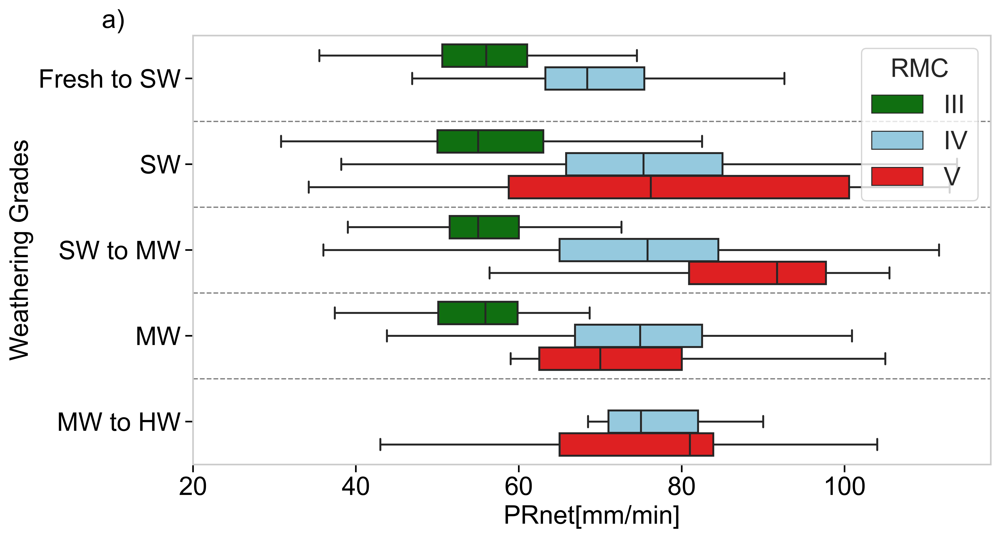

In [8]:
# Assuming the column names are 'Weathering', 'PRnet', and 'RMC', adjust as needed
weathering_column = 'Weathering'
penetration_rate_column = 'PRnet'

# Set seaborn style
sns.set(style="whitegrid")

# Define colors for each RMC class
rmc_colors = {'III': 'green', 'IV': 'skyblue', 'V': 'red'}

# Set font
plt.rcParams['font.family'] = 'Arial'

# Specify the order of RMC levels
rmc_order = ['III', 'IV', 'V']

# Specify the order of weathering categories
weathering_order = ['Fresh to SW', 'SW', 'SW to MW', 'MW', 'MW to HW']

# Create box plot using Seaborn
plt.figure(figsize=(11, 6), dpi=800) 
ax = sns.boxplot(x=penetration_rate_column, y=weathering_column, hue='RMC', data=df,
                 showfliers=False, palette=rmc_colors, linewidth=1.5, hue_order=rmc_order, order=weathering_order)

plt.xlabel('PRnet[mm/min]', fontsize=20, color='black')
plt.ylabel('Weathering Grades', fontsize=20, color='black')
plt.title('', fontsize=20, color='black')
plt.xticks(fontsize=20, color='black')
plt.yticks(rotation=0, fontsize=20, color='black')

# Explicitly set ticks to be visible on both axes
plt.tick_params(axis='x', which='both', bottom=True, color='black')
plt.tick_params(axis='y', which='both', left=True, color='black')

# Remove grid lines
plt.grid(False)

# Set x-axis ticks with an interval of 10 starting from 0
ax.xaxis.set_major_locator(MultipleLocator(20))
ax.set_xlim(left=20)  # Ensure x-axis starts at 0

# Add dotted lines to separate weathering grades
for i, weathering in enumerate(weathering_order):
    # Find the y-coordinate for the line (in terms of the plot's y-ticks)
    y_coord = i - 0.5  # Adjust as necessary for spacing
    ax.axhline(y=y_coord, color='gray', linestyle='--', linewidth=1)

# Increase the size of the legend
legend = plt.legend(title='RMC', title_fontsize=20,loc='upper right', fontsize=20, ncol=1)

plt.title('a)', x=-0.1,y=1, fontsize=20)
plt.tight_layout()
plt.show()

C:\Programs\Anaconda3\2024.02\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


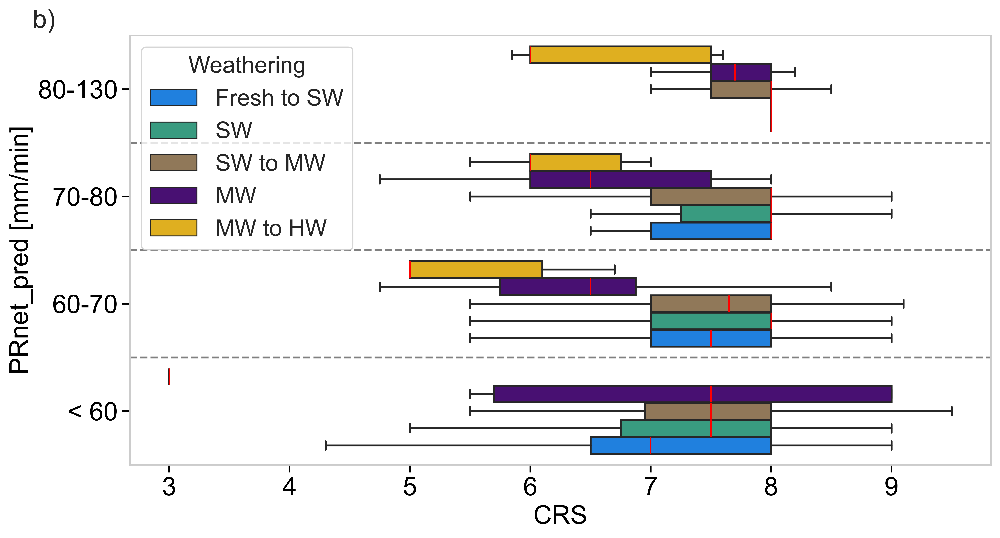

In [10]:
# Define the columns
torque_column = 'CRS'
penetration_rate_column = 'PRnet'
weathering_column = 'Weathering'

# Check if the required columns exist
required_columns = [torque_column, penetration_rate_column, weathering_column]
for col in required_columns:
    if col not in df.columns:
        raise ValueError(f"Column '{col}' is not in the DataFrame")

# Define custom bins
bins = [0, 60, 70, 80, df[penetration_rate_column].max()]
bin_labels = ['< 60', '60-70', '70-80', '80-130']

# Assign each PRnet value to a bin
df['PRnet_bin'] = pd.cut(df[penetration_rate_column], bins=bins, labels=bin_labels, include_lowest=True)

# Define color palette for RMC categories
palette = {
    'Fresh to SW': '#0080FE',
    'SW': '#29AB87',
    'SW to MW': '#997950',
    'MW': 'indigo',
    'MW to HW': '#FFBF00'
}


# Define the desired order for RMC categories
weathering_order = ['Fresh to SW', 'SW', 'SW to MW', 'MW', 'MW to HW']

# Create the plot using Seaborn
plt.figure(figsize=(11, 6), dpi=800)

# Plot the box plot
ax = sns.boxplot(
    data=df,
    x=torque_column,
    y='PRnet_bin',
    hue=weathering_column,
    palette=palette,
    showfliers=False,
    order=bin_labels,  
    hue_order=weathering_order,  
    medianprops=dict(color='red', linewidth=1) 
)

# Customize the plot
plt.xlabel('CRS', fontsize=20,color='black' )
plt.ylabel('PRnet_pred [mm/min]', fontsize=20,color='black')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=20, color='black')
plt.yticks(ticks=range(len(bin_labels)), labels=bin_labels)

# Explicitly set ticks to be visible on both axes
plt.tick_params(axis='x', which='both', bottom=True, color='black')
plt.tick_params(axis='y', which='both', left=True, color='black')

# Reverse y-axis order if needed
plt.gca().invert_yaxis()


# Add separating lines between bins
for i in range(len(bin_labels) - 1):
    plt.axhline(y=i + 0.5, color='gray', linestyle='--')

# Add legend
plt.legend(title='Weathering', title_fontsize='18', fontsize='18', loc='upper left', ncol=1)

plt.grid(False)
plt.title('b)', x=-0.1,y=1, fontsize=20)
plt.tight_layout()
plt.show()

C:\Programs\Anaconda3\2024.02\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


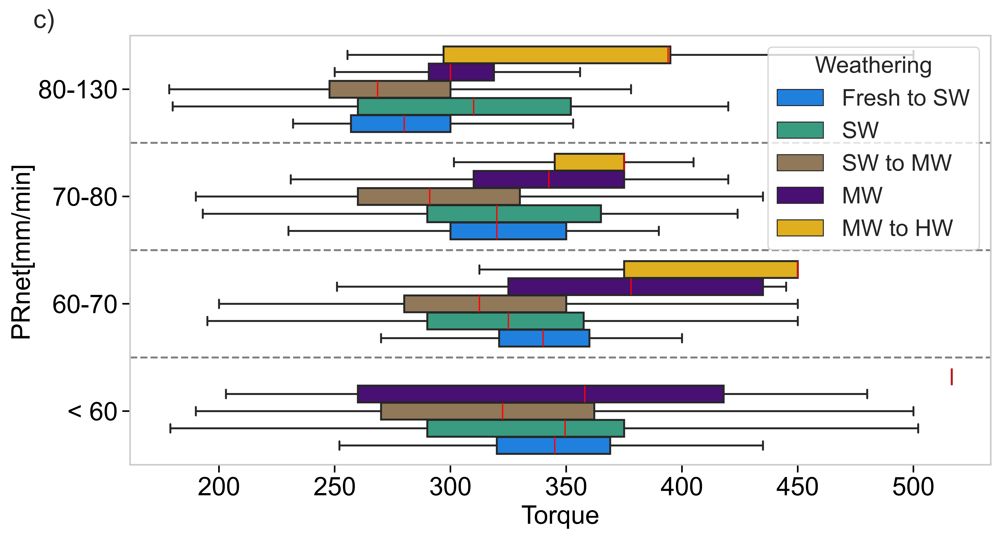

In [13]:
# Define the columns
torque_column = 'Torque'
penetration_rate_column = 'PRnet'
weathering_column = 'Weathering'

# Check if the required columns exist
required_columns = [torque_column, penetration_rate_column, weathering_column]
for col in required_columns:
    if col not in df.columns:
        raise ValueError(f"Column '{col}' is not in the DataFrame")

# Define custom bins
bins = [0, 60, 70, 80, df[penetration_rate_column].max()]
bin_labels = ['< 60', '60-70', '70-80', '80-130']

# Assign each PRnet value to a bin
df['PRnet_bin'] = pd.cut(df[penetration_rate_column], bins=bins, labels=bin_labels, include_lowest=True)

# Define color palette for RMC categories
palette = {
    'Fresh to SW': '#0080FE',
    'SW': '#29AB87',
    'SW to MW': '#997950',
    'MW': 'indigo',
    'MW to HW': '#FFBF00'
}


# Define the desired order for RMC categories
weathering_order = ['Fresh to SW', 'SW', 'SW to MW', 'MW', 'MW to HW']

# Create the plot using Seaborn
plt.figure(figsize=(11, 6), dpi=800)

# Plot the box plot
ax = sns.boxplot(
    data=df,
    x=torque_column,
    y='PRnet_bin',
    hue=weathering_column,
    palette=palette,
    showfliers=False,
    order=bin_labels,  
    hue_order=weathering_order,  
    medianprops=dict(color='red', linewidth=1) 
)

# Customize the plot
plt.xlabel('Torque', fontsize=20,color='black' )
plt.ylabel('PRnet[mm/min]', fontsize=20,color='black')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=20, color='black')
plt.yticks(ticks=range(len(bin_labels)), labels=bin_labels)

# Explicitly set ticks to be visible on both axes
plt.tick_params(axis='x', which='both', bottom=True, color='black')
plt.tick_params(axis='y', which='both', left=True, color='black')

# Reverse y-axis order if needed
plt.gca().invert_yaxis()


# Add separating lines between bins
for i in range(len(bin_labels) - 1):
    plt.axhline(y=i + 0.5, color='gray', linestyle='--')

# Add legend
plt.legend(title='Weathering', title_fontsize='18', fontsize='18', loc='upper right', ncol=1)

plt.grid(False)
plt.title('c)', x=-0.1,y=1, fontsize=20)
plt.tight_layout()
plt.show()

C:\Programs\Anaconda3\2024.02\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


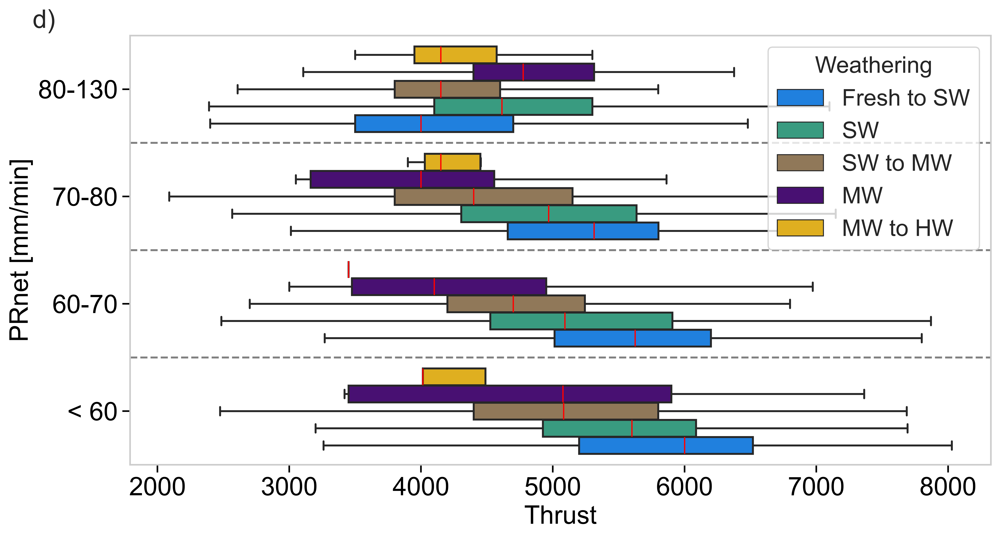

In [15]:
# Define the columns
torque_column = 'Thrust'
penetration_rate_column = 'PRnet'
weathering_column = 'Weathering'

# Check if the required columns exist
required_columns = [torque_column, penetration_rate_column, weathering_column]
for col in required_columns:
    if col not in df.columns:
        raise ValueError(f"Column '{col}' is not in the DataFrame")

# Define custom bins
bins = [0, 60, 70, 80, df[penetration_rate_column].max()]
bin_labels = ['< 60', '60-70', '70-80', '80-130']

# Assign each PRnet value to a bin
df['PRnet_bin'] = pd.cut(df[penetration_rate_column], bins=bins, labels=bin_labels, include_lowest=True)

# Define color palette for RMC categories
palette = {
    'Fresh to SW': '#0080FE',
    'SW': '#29AB87',
    'SW to MW': '#997950',
    'MW': 'indigo',
    'MW to HW': '#FFBF00'
}


# Define the desired order for RMC categories
weathering_order = ['Fresh to SW', 'SW', 'SW to MW', 'MW', 'MW to HW']

# Create the plot using Seaborn
plt.figure(figsize=(11, 6), dpi=800)

# Plot the box plot
ax = sns.boxplot(
    data=df,
    x=torque_column,
    y='PRnet_bin',
    hue=weathering_column,
    palette=palette,
    showfliers=False,
    order=bin_labels,  
    hue_order=weathering_order,  
    medianprops=dict(color='red', linewidth=1) 
)

# Customize the plot
plt.xlabel('Thrust', fontsize=20,color='black' )
plt.ylabel('PRnet [mm/min]', fontsize=20,color='black')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=20, color='black')
plt.yticks(ticks=range(len(bin_labels)), labels=bin_labels)

# Explicitly set ticks to be visible on both axes
plt.tick_params(axis='x', which='both', bottom=True, color='black')
plt.tick_params(axis='y', which='both', left=True, color='black')

# Reverse y-axis order if needed
plt.gca().invert_yaxis()


# Add separating lines between bins
for i in range(len(bin_labels) - 1):
    plt.axhline(y=i + 0.5, color='gray', linestyle='--')

# Add legend
plt.legend(title='Weathering', title_fontsize='18', fontsize='18', loc='upper right', ncol=1)

plt.grid(False)
plt.title('d)', x=-0.1,y=1, fontsize=20)
plt.tight_layout()
plt.show()

## 3. Rock Strength

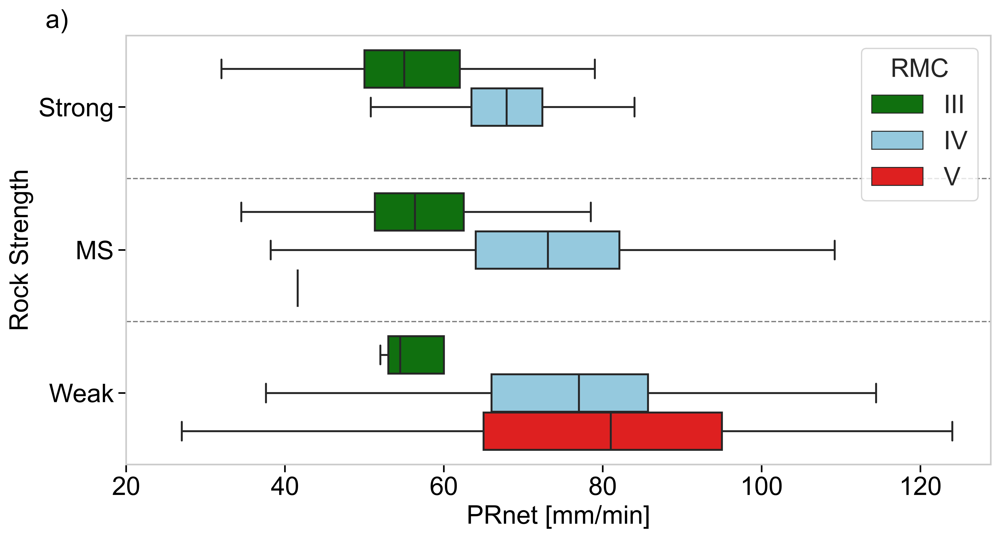

In [18]:
# Assuming the column names are 'Rock Strength', 'PRnet', and 'RMC', adjust as needed
rockstrength_column = 'Rock Strength'
penetration_rate_column = 'PRnet'

# Set seaborn style
sns.set(style="whitegrid")

# Define colors for each RMC class
rmc_colors = {'III': 'green', 'IV': 'skyblue', 'V': 'red'}

# Set font
plt.rcParams['font.family'] = 'Arial'

# Specify the order of RMC levels
rmc_order = ['III', 'IV', 'V']

# Specify the order of weathering categories
rockstrength_order = ['Strong', 'MS', 'Weak']

# Create box plot using Seaborn
plt.figure(figsize=(11, 6), dpi=800)  # Adjust figure size if needed
ax = sns.boxplot(x=penetration_rate_column, y=rockstrength_column, hue='RMC', data=df,
                 showfliers=False, palette=rmc_colors, linewidth=1.5, hue_order=rmc_order, order=rockstrength_order)

plt.xlabel('PRnet [mm/min]', fontsize=20, color='black')
plt.ylabel('Rock Strength', fontsize=20, color='black')
plt.title('', fontsize=20, color='black')
plt.xticks(fontsize=20, color='black')
plt.yticks(rotation=0, fontsize=20, color='black')

# Explicitly set ticks to be visible on both axes
plt.tick_params(axis='x', which='both', bottom=True, color='black')
plt.tick_params(axis='y', which='both', left=True, color='black')

# Remove grid lines
plt.grid(False)

# Set x-axis ticks with an interval of 10 starting from 0
ax.xaxis.set_major_locator(MultipleLocator(20))
ax.set_xlim(left=20)  # Ensure x-axis starts at 0

# Add dotted lines to separate rock strength
for i, rockstrength in enumerate(rockstrength_order):
    # Find the y-coordinate for the line (in terms of the plot's y-ticks)
    y_coord = i - 0.5  # Adjust as necessary for spacing
    ax.axhline(y=y_coord, color='gray', linestyle='--', linewidth=1)

# Increase the size of the legend
legend = plt.legend(title='RMC', title_fontsize=20,loc='upper right', fontsize=20, ncol=1)

plt.title('a)', x=-0.08,y=1, fontsize=20)
plt.tight_layout()
plt.show()

C:\Programs\Anaconda3\2024.02\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


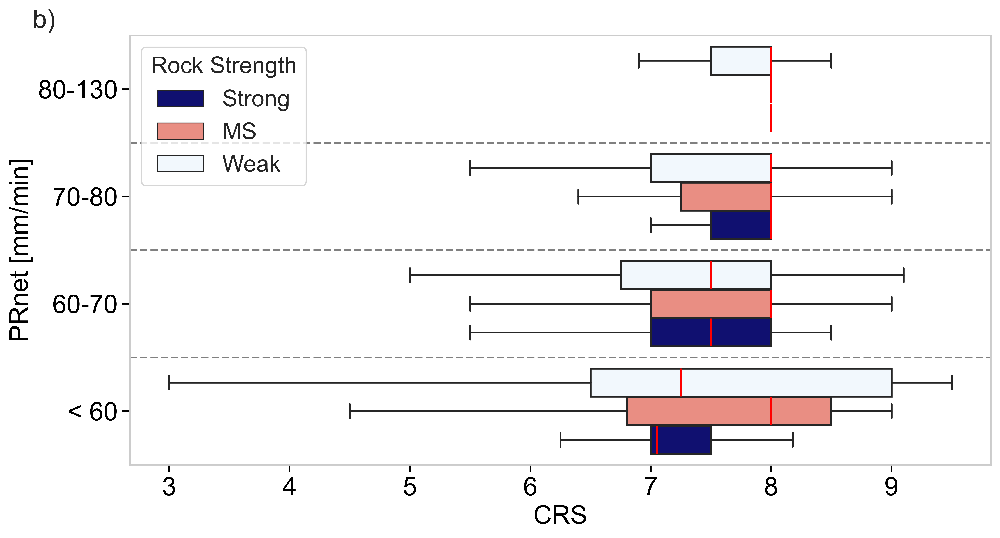

In [20]:
# Define the columns
torque_column = 'CRS'
penetration_rate_column = 'PRnet'
rockstrength_column = 'Rock Strength'

# Check if the required columns exist
required_columns = [torque_column, penetration_rate_column, rockstrength_column]
for col in required_columns:
    if col not in df.columns:
        raise ValueError(f"Column '{col}' is not in the DataFrame")

# Define custom bins
bins = [0, 60, 70, 80, df[penetration_rate_column].max()]
bin_labels = ['< 60', '60-70', '70-80', '80-130']

# Assign each PRnet value to a bin
df['PRnet_bin'] = pd.cut(df[penetration_rate_column], bins=bins, labels=bin_labels, include_lowest=True)

# Define color palette for RMC categories
palette = {
    'Strong': 'navy',
    'MS': 'salmon',
    'Weak': 'aliceblue'
}

# Define the desired order for RMC categories
rockstrength_order = ['Strong', 'MS', 'Weak']

# Create the plot using Seaborn
plt.figure(figsize=(11, 6), dpi=800)

# Plot the box plot
ax = sns.boxplot(
    data=df,
    x=torque_column,
    y='PRnet_bin',
    hue=rockstrength_column,
    palette=palette,
    showfliers=False,
    order=bin_labels,  
    hue_order=rockstrength_order,  
    medianprops=dict(color='red') 
)

# Customize the plot
plt.xlabel('CRS', fontsize=20, color='black')
plt.ylabel('PRnet [mm/min]', fontsize=20, color='black')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=20, color='black')
plt.yticks(ticks=range(len(bin_labels)), labels=bin_labels)

# Explicitly set ticks to be visible on both axes
plt.tick_params(axis='x', which='both', bottom=True, color='black')
plt.tick_params(axis='y', which='both', left=True, color='black')

# Reverse y-axis order if needed
plt.gca().invert_yaxis()


# Add separating lines between bins
for i in range(len(bin_labels) - 1):
    plt.axhline(y=i + 0.5, color='gray', linestyle='--')

# Add legend
plt.legend(title='Rock Strength', title_fontsize='18', fontsize='18', loc='upper left', ncol=1)

plt.grid(False)
plt.title('b)', x=-0.1,y=1, fontsize=20)
plt.tight_layout()
plt.show()

C:\Programs\Anaconda3\2024.02\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


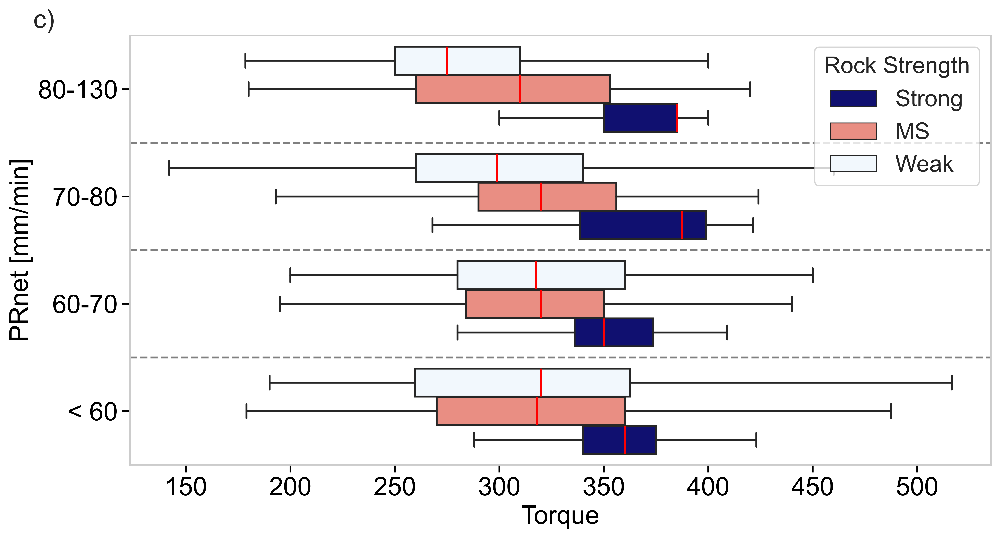

In [22]:
# Define the columns
torque_column = 'Torque'
penetration_rate_column = 'PRnet'
rockstrength_column = 'Rock Strength'

# Check if the required columns exist
required_columns = [torque_column, penetration_rate_column, rockstrength_column]
for col in required_columns:
    if col not in df.columns:
        raise ValueError(f"Column '{col}' is not in the DataFrame")

# Define custom bins
bins = [0, 60, 70, 80, df[penetration_rate_column].max()]
bin_labels = ['< 60', '60-70', '70-80', '80-130']

# Assign each PRnet value to a bin
df['PRnet_bin'] = pd.cut(df[penetration_rate_column], bins=bins, labels=bin_labels, include_lowest=True)

# Define color palette for RMC categories
palette = {
    'Strong': 'navy',
    'MS': 'salmon',
    'Weak': 'aliceblue'
}

# Define the desired order for RMC categories
rockstrength_order = ['Strong', 'MS', 'Weak']

# Create the plot using Seaborn
plt.figure(figsize=(11, 6), dpi=800)

# Plot the box plot
ax = sns.boxplot(
    data=df,
    x=torque_column,
    y='PRnet_bin',
    hue=rockstrength_column,
    palette=palette,
    showfliers=False,
    order=bin_labels,  
    hue_order=rockstrength_order,  
    medianprops=dict(color='red')  
)

# Customize the plot
plt.xlabel('Torque', fontsize=20, color='black')
plt.ylabel('PRnet [mm/min]', fontsize=20, color='black')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=20, color='black')
plt.yticks(ticks=range(len(bin_labels)), labels=bin_labels)

# Explicitly set ticks to be visible on both axes
plt.tick_params(axis='x', which='both', bottom=True, color='black')
plt.tick_params(axis='y', which='both', left=True, color='black')

# Reverse y-axis order if needed
plt.gca().invert_yaxis()


# Add separating lines between bins
for i in range(len(bin_labels) - 1):
    plt.axhline(y=i + 0.5, color='gray', linestyle='--')

# Add legend
plt.legend(title='Rock Strength', title_fontsize='18', fontsize='18', loc='upper right', ncol=1)

plt.grid(False)
plt.title('c)', x=-0.1,y=1, fontsize=20)
plt.tight_layout()
plt.show()

C:\Programs\Anaconda3\2024.02\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


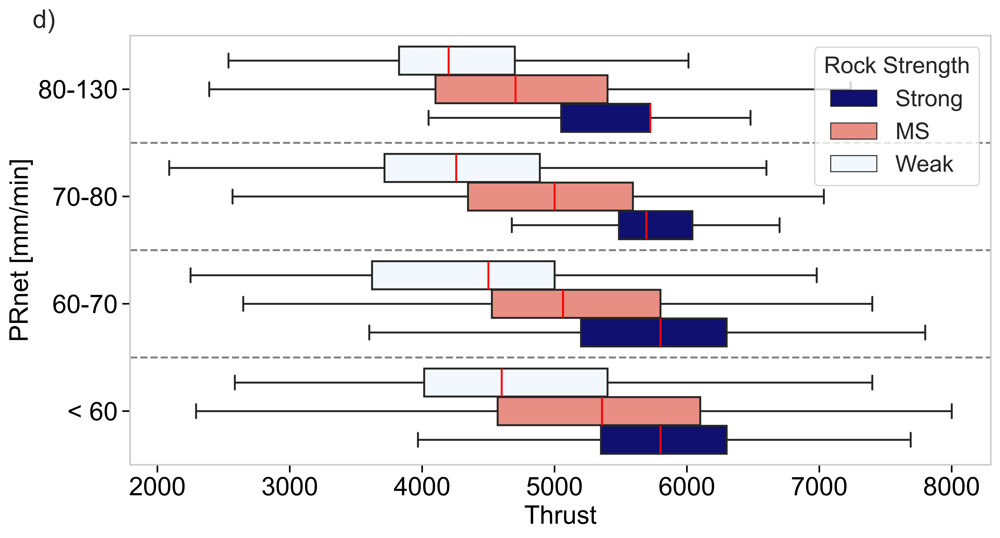

In [24]:
# Define the columns
thrust_column = 'Thrust'
penetration_rate_column = 'PRnet'
rockstrength_column = 'Rock Strength'

# Check if the required columns exist
required_columns = [thrust_column, penetration_rate_column, rockstrength_column]
for col in required_columns:
    if col not in df.columns:
        raise ValueError(f"Column '{col}' is not in the DataFrame")

# Define custom bins
bins = [0, 60, 70, 80, df[penetration_rate_column].max()]
bin_labels = ['< 60', '60-70', '70-80', '80-130']

# Assign each PRnet value to a bin
df['PRnet_bin'] = pd.cut(df[penetration_rate_column], bins=bins, labels=bin_labels, include_lowest=True)

# Define color palette for RMC categories
palette = {
    'Strong': 'navy',
    'MS': 'salmon',
    'Weak': 'aliceblue'
}

# Define the desired order for RMC categories
rockstrength_order = ['Strong', 'MS', 'Weak']

# Create the plot using Seaborn
plt.figure(figsize=(11, 6), dpi=800)

# Plot the box plot
ax = sns.boxplot(
    data=df,
    x=thrust_column,
    y='PRnet_bin',
    hue=rockstrength_column,
    palette=palette,
    showfliers=False,
    order=bin_labels,  
    hue_order=rockstrength_order,  
    medianprops=dict(color='red')  
)

# Customize the plot
plt.xlabel('Thrust', fontsize=20, color='black')
plt.ylabel('PRnet [mm/min]', fontsize=20, color='black')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=20, color='black')
plt.yticks(ticks=range(len(bin_labels)), labels=bin_labels)

# Explicitly set ticks to be visible on both axes
plt.tick_params(axis='x', which='both', bottom=True, color='black')
plt.tick_params(axis='y', which='both', left=True, color='black')

# Reverse y-axis order if needed
plt.gca().invert_yaxis()


# Add separating lines between bins
for i in range(len(bin_labels) - 1):
    plt.axhline(y=i + 0.5, color='gray', linestyle='--')

# Add legend
plt.legend(title='Rock Strength', title_fontsize='18', fontsize='18', loc='upper right', ncol=1)

plt.grid(False)
plt.title('d)', x=-0.1,y=1, fontsize=20)
plt.tight_layout()
plt.show()

## 4. TBM Net Penetration Rate at the Critical Section

## 4.1 Assessment at TBM Stuck or Cutterhead Jammed Section

In [40]:
# Importing the Libraries
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec


# load the dataset
data = pd.read_excel('combine data after prediction.xlsx')

# Define the chainage range for plotting
chainage_min = 8560
chainage_max = 8640

# Filter data within the chainage range
filtered_data = data[(data['Chainage'] >= chainage_min) & (data['Chainage'] <= chainage_max)]

# Extract data
chainage = filtered_data['Chainage']
rmr_values = filtered_data['RMR']
prnet_values = filtered_data['PRnet']
prnetpred_values = filtered_data['PRnet_pred']
th_values = filtered_data['Thrust']
to_values = filtered_data['Torque']  # Assuming this column exists
rock_strength_values = filtered_data['Rock Strength']  # Assuming this column exists
lithology_types = filtered_data['Lithology'].unique()
weathering_classes = filtered_data['Weathering'].unique()
rock_strength_classes = filtered_data['Rock Strength'].unique()

# Calculate mean values for the entire dataset
mean_rmr_full = data['RMR'].mean()
mean_prnet_full = data['PRnet'].mean()
mean_thrust_full = data['Thrust'].mean()
mean_torque_full = data['Torque'].mean()

# Assign colors for each lithology type
lithology_colors = {
    'SST, MST': '#c7e9c0',
    'SST': '#FFD1DC',
    'SST, SIST, MST': 'lightgrey',
    'SST, SIST': 'cyan',
    'SIST, MST': 'orange',
    'MST': 'black',
    'CONG, SST, MST': '#FF00FF',
    'CONG': 'yellow',
    'CONG, SST, SIST, MST': 'Lime',
    'CONG, SST': 'blue'
}

# Define colors for each weathering class
weathering_colors = {
    'Fresh to SW': '#0080FE',
    'SW': '#29AB87',
    'SW to MW': '#997950',
    'MW': 'indigo',
    'MW to HW': '#FFBF00'
}

# Define colors for each rock strength class
rock_strength_colors = {
    'Strong': 'navy',
    'MS': 'salmon',
    'Weak': 'aliceblue'
}
# Set font to Arial
plt.rcParams['font.family'] = 'Arial'
# Create a GridSpec layout
fig = plt.figure(figsize=(16, 16), dpi=800)  # Adjust overall figure size
gs = gridspec.GridSpec(6, 1, height_ratios=[0.7, 0.7, 0.7, 0.7, 0.2, 0.2])  # Added space for Rock Strength and Weathering

# Create subplots with GridSpec
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])
ax5 = plt.subplot(gs[4])  # Rock Strength plot
ax6 = plt.subplot(gs[5])  # Weathering plot

# Function to set common x-axis limits
def set_common_x_limits(ax):
    ax.set_xlim(chainage_min, chainage_max)


# Plot Torque
ax1.plot(chainage, to_values, label='Torque', color='purple', marker='x', linestyle='-', zorder=1)
ax1.set_ylabel('Torque', fontsize=16, rotation = 0, color='purple', labelpad=30)
ax1.tick_params(axis='y', labelcolor='purple', labelsize=16)
ax1.tick_params(axis='x')
set_common_x_limits(ax1)
ax1.set_xticklabels([])  # Hide x-tick labels for ax1

# Annotate mean Torque (full dataset)
ax1.axhline(y=mean_torque_full, color='purple', linestyle='--', linewidth=1)
ax1.text(chainage_max, mean_torque_full+0.5, f'Mean: {mean_torque_full:.2f}', 
         verticalalignment='bottom',horizontalalignment='right', fontsize=16, color='purple')


# Plot Thrust
ax2.plot(chainage, th_values, label='Thrust', color='green', marker='s', linestyle='-', zorder=1)
ax2.set_ylabel('Thrust', fontsize=16, rotation = 0,color='green', labelpad=30)
ax2.tick_params(axis='y', labelcolor='green', labelsize=16)
ax2.tick_params(axis='x')
set_common_x_limits(ax2)
ax2.set_xticklabels([])  # Hide x-tick labels for ax2

# Annotate mean Thrust (full dataset)
ax2.axhline(y=mean_thrust_full, color='green', linestyle='--', linewidth=1)
ax2.text(chainage_max, mean_thrust_full+0.5, f'Mean: {mean_thrust_full:.2f}', 
         verticalalignment='bottom',horizontalalignment='right', fontsize=16, color='green')

# Plot PRnet and PRnet_pred
ax3.plot(chainage, prnet_values, label='PRnet', color='red', marker='^', linestyle='-', zorder=1)
ax3.plot(chainage, prnetpred_values, label='PRnet_pred', color='black', marker='o', linestyle='--', zorder=2)
ax3.set_ylabel('PRnet', fontsize=16, rotation=0, color='red', labelpad=30)
ax3.tick_params(axis='y', labelcolor='red', labelsize=16)
ax3.tick_params(axis='x', labelsize=0)
set_common_x_limits(ax3)
ax3.set_xticklabels([])  # Hide x-tick labels for ax3

# Annotate mean PRnet (full dataset)
ax3.axhline(y=mean_prnet_full, color='red', linestyle='--', linewidth=1)
ax3.text(chainage_max, mean_prnet_full + 0.5, f'Mean: {mean_prnet_full:.2f}', 
         verticalalignment='bottom', horizontalalignment='right', fontsize=16, color='red')

# Add a legend to differentiate between PRnet and PRnet_pred
ax3.legend(loc='upper left', bbox_to_anchor=(0.75, 0.9), fontsize=16)

# Plot RMR
ax4.plot(chainage, rmr_values, label='RMR', color='blue', marker='o', zorder=2)
ax4.set_ylabel('RMR', fontsize=16, rotation = 0, color='blue', labelpad=30)
ax4.tick_params(axis='y', labelcolor='blue', labelsize=16)
ax4.tick_params(axis='x', labelsize=0)
set_common_x_limits(ax4)
ax4.set_xticklabels([])  # Hide x-tick labels for ax2

# Annotate mean RMR (full dataset)
ax4.axhline(y=mean_rmr_full, color='blue', linestyle='--', linewidth=1)
ax4.text(chainage_max, mean_rmr_full+0.5, f'Mean: {mean_rmr_full:.2f}', 
         verticalalignment='bottom',horizontalalignment='right', fontsize=16, color='blue')

# Plot Rock Strength
grouped_rock_strength = []
prev_rock_strength = None
start_chainage = chainage.iloc[0]

for i in range(len(chainage)):
    current_chainage = chainage.iloc[i]
    current_rock_strength = filtered_data['Rock Strength'].iloc[i]
    
    if prev_rock_strength is None:
        prev_rock_strength = current_rock_strength

    if current_rock_strength != prev_rock_strength:
        grouped_rock_strength.append((start_chainage, chainage.iloc[i], prev_rock_strength))
        start_chainage = current_chainage
        prev_rock_strength = current_rock_strength

# Append the last group
grouped_rock_strength.append((start_chainage, chainage.iloc[-1], prev_rock_strength))

for start, end, rock_strength in grouped_rock_strength:
    ax5.axvspan(start, end, color=rock_strength_colors.get(rock_strength, 'grey'), alpha=0.7, zorder=0)  # default to grey if not found
    ax5.text((start + end) / 2, 0.5, rock_strength, horizontalalignment='center', 
             verticalalignment='center', fontsize=16, alpha=1, zorder=3)

# Set the y-axis limits and remove labels for the Rock Strength plot
ax5.set_ylim(0, 1)
ax5.set_yticks([])
ax5.set_ylabel('Rock Strength', fontsize=16,rotation=0, labelpad=60)
set_common_x_limits(ax5)
ax5.set_xticklabels([])  # Ensure no x-tick labels are shown for ax5

# Plot Weathering
grouped_weathering = []
prev_weathering = None
start_chainage = chainage.iloc[0]

for i in range(len(chainage)):
    current_chainage = chainage.iloc[i]
    current_weathering = filtered_data['Weathering'].iloc[i]
    
    if prev_weathering is None:
        prev_weathering = current_weathering

    if current_weathering != prev_weathering:
        grouped_weathering.append((start_chainage, chainage.iloc[i], prev_weathering))
        start_chainage = current_chainage
        prev_weathering = current_weathering

# Append the last group
grouped_weathering.append((start_chainage, chainage.iloc[-1], prev_weathering))

for start, end, weathering in grouped_weathering:
    ax6.axvspan(start, end, color=weathering_colors.get(weathering, 'grey'), alpha=0.7, zorder=0)  # default to grey if not found
    ax6.text((start + end) / 2, 0.5, weathering, horizontalalignment='center',
             verticalalignment='center', fontsize=16, alpha=1, zorder=3)

# Set the y-axis limits and remove labels for the weathering plot
ax6.set_ylim(0, 1)
ax6.set_yticks([])
ax6.set_ylabel('Weathering', fontsize=16, rotation=0, labelpad=60)
ax6.set_xlabel('Chainage', fontsize=16)
ax6.tick_params(axis='x', labelsize=16)
ax6.tick_params(axis='y', labelsize=16)
set_common_x_limits(ax6)

# Group contiguous lithology ranges
grouped_lithology = []
prev_lithology = None
start_chainage = chainage.iloc[0]

for i in range(len(chainage)):
    current_chainage = chainage.iloc[i]
    current_lithology = filtered_data['Lithology'].iloc[i]
    
    if prev_lithology is None:
        prev_lithology = current_lithology

    if current_lithology != prev_lithology:
        grouped_lithology.append((start_chainage, chainage.iloc[i], prev_lithology))
        start_chainage = current_chainage
        prev_lithology = current_lithology

# Append the last group
grouped_lithology.append((start_chainage, chainage.iloc[-1], prev_lithology))

# Color the background according to Lithology with the custom colors and add lithology names
for ax in [ax1, ax2, ax3, ax4]:
    for start, end, lithology in grouped_lithology:
        ax.axvspan(start, end, color=lithology_colors.get(lithology, 'grey'), alpha=0.7, zorder=0)  # default to grey if not found
        if ax == ax4:  # Only add lithology text to ax4
            ax.text((start + end) / 2, ax.get_ylim()[1] * 0.6, lithology, horizontalalignment='center',
                    verticalalignment='bottom', fontsize=16, alpha=1, zorder=3)

# Define the annotations with their positions and texts
annotations = {
    8573.10: 'Lithology transition section',
    8588.86: 'TBM stuck section',
    8606.262: 'TBM cutter jammed section',
    8617.90: 'Lithology transition section'
}

# Function to add vertical lines and annotations to a specific axis
def add_lines_and_annotations_to_axis(ax, annotations):
    for chainage, text in annotations.items():
        # Add vertical line
        ax.axvline(x=chainage, color='black', linestyle='--', linewidth=1.5, zorder=1)
        # Add text annotation
        x_position = chainage + (chainage_max - chainage_min) * 0.012  # Offset to the right
        if x_position > chainage_max:
            x_position = chainage_max - (chainage_max - chainage_min) * 0.02  # Ensure it's within bounds
        ax.text(x_position, ax.get_ylim()[1] * 0.96, text, color='black', fontsize=16, verticalalignment='top', horizontalalignment='left', rotation=90, zorder=2)

# Apply vertical lines and annotations only to ax1
add_lines_and_annotations_to_axis(ax4, annotations)

# Apply only vertical lines to other axes (if needed)
def add_lines_only_to_axis(ax, annotations):
    for chainage in annotations.keys():
        ax.axvline(x=chainage, color='black', linestyle='--', linewidth=1.5, zorder=1)

# Apply vertical lines only to ax2, ax3, ax4, ax5, ax6
for ax in [ax1,ax2, ax3, ax5, ax6]:
    add_lines_only_to_axis(ax, annotations)

# Ensure grid settings for all axes
for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    ax.xaxis.grid(True, color='black', linestyle='-', linewidth=0.2)  # Enable x-axis grid lines
    ax.yaxis.grid(False)  # Disable y-axis grid lines

plt.tight_layout()
plt.subplots_adjust(hspace=0.03)  # Adjust the space between rows
plt.show()


## 4.2 Assessment at Difficult Ground (Thrust Zone)

In [42]:
# Define the formation to filter
formation_filter = 'BT'  # Change this to the formation you want to filter

# Filter the data to include only rows with the specified formation
filtered_data = data[data['Formation'] == formation_filter]

# Determine the chainage range from the filtered data
chainage_min = filtered_data['Chainage'].min()
chainage_max = filtered_data['Chainage'].max()

# Extract data
chainage = filtered_data['Chainage']
rmr_values = filtered_data['RMR']
prnet_values = filtered_data['PRnet']
prnetpred_values = filtered_data['PRnet_pred']
th_values = filtered_data['Thrust']
to_values = filtered_data['Torque']  # Assuming this column exists
rock_strength_values = filtered_data['Rock Strength']  # Assuming this column exists
lithology_types = filtered_data['Lithology'].unique()
weathering_classes = filtered_data['Weathering'].unique()
rock_strength_classes = filtered_data['Rock Strength'].unique()

# Calculate mean values for the entire dataset
mean_rmr_full = data['RMR'].mean()
mean_prnet_full = data['PRnet'].mean()
mean_thrust_full = data['Thrust'].mean()
mean_torque_full = data['Torque'].mean()

# Assign colors for each lithology type
lithology_colors = {
    'SST, MST': '#c7e9c0',
    'SST': '#FFD1DC',
    'SST, SIST, MST': 'lightgrey',
    'SST, SIST': 'cyan',
    'SIST, MST': 'orange',
    'MST': 'black',
    'CONG, SST, MST': '#FF00FF',
    'CONG': 'yellow',
    'CONG, SST, SIST, MST': 'Lime',
    'CONG, SST': 'blue'
}

# Define colors for each weathering class
weathering_colors = {
    'Fresh to SW': '#0080FE',
    'SW': '#29AB87',
    'SW to MW': '#997950',
    'MW': 'indigo',
    'MW to HW': '#FFBF00'
}

# Define colors for each rock strength class
rock_strength_colors = {
    'Strong': 'navy',
    'MS': 'salmon',
    'Weak': 'aliceblue'
}
# Set font to Arial
plt.rcParams['font.family'] = 'Arial'
# Create a GridSpec layout
fig = plt.figure(figsize=(16, 16), dpi=800)  # Adjust overall figure size
gs = gridspec.GridSpec(6, 1, height_ratios=[0.7, 0.7, 0.7, 0.7, 0.3, 0.3])  # Added space for Rock Strength and Weathering

# Create subplots with GridSpec
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])
ax5 = plt.subplot(gs[4])  # Rock Strength plot
ax6 = plt.subplot(gs[5])  # Weathering plot

# Function to set common x-axis limits
def set_common_x_limits(ax):
    ax.set_xlim(chainage_min, chainage_max)


# Plot Torque
ax1.plot(chainage, to_values, label='Torque', color='purple', marker='x', linestyle='-', zorder=1)
ax1.set_ylabel('Torque', fontsize=16, rotation = 0, color='purple', labelpad=30)
ax1.tick_params(axis='y', labelcolor='purple', labelsize=16)
ax1.tick_params(axis='x')
set_common_x_limits(ax1)
ax1.set_xticklabels([])  # Hide x-tick labels for ax1

# Annotate mean Torque (full dataset)
ax1.axhline(y=mean_torque_full, color='purple', linestyle='--', linewidth=1)
ax1.text(chainage_max, mean_torque_full+0.5, f'Mean: {mean_torque_full:.2f}', 
         verticalalignment='bottom',horizontalalignment='right', fontsize=16, color='purple')


# Plot Thrust
ax2.plot(chainage, th_values, label='Thrust', color='green', marker='s', linestyle='-', zorder=1)
ax2.set_ylabel('Thrust', fontsize=16, rotation = 0,color='green', labelpad=30)
ax2.tick_params(axis='y', labelcolor='green', labelsize=16)
ax2.tick_params(axis='x')
set_common_x_limits(ax2)
ax2.set_xticklabels([])  # Hide x-tick labels for ax2

# Annotate mean Thrust (full dataset)
ax2.axhline(y=mean_thrust_full, color='green', linestyle='--', linewidth=1)
ax2.text(chainage_max, mean_thrust_full+0.5, f'Mean: {mean_thrust_full:.2f}', 
         verticalalignment='bottom',horizontalalignment='right', fontsize=16, color='green')

# Plot PRnet and PRnet_pred
ax3.plot(chainage, prnet_values, label='PRnet', color='red', marker='^', linestyle='-', zorder=1)
ax3.plot(chainage, prnetpred_values, label='PRnet_pred', color='black', marker='o', linestyle='--', zorder=2)
ax3.set_ylabel('PRnet', fontsize=16, rotation=0, color='red', labelpad=30)
ax3.tick_params(axis='y', labelcolor='red', labelsize=16)
ax3.tick_params(axis='x', labelsize=0)
set_common_x_limits(ax3)
ax3.set_xticklabels([])  # Hide x-tick labels for ax3

# Annotate mean PRnet (full dataset)
ax3.axhline(y=mean_prnet_full, color='red', linestyle='--', linewidth=1)
ax3.text(chainage_max, mean_prnet_full + 0.5, f'Mean: {mean_prnet_full:.2f}', 
         verticalalignment='bottom', horizontalalignment='right', fontsize=16, color='red')

# Add a legend to differentiate between PRnet and PRnet_pred
ax3.legend(loc='upper left', bbox_to_anchor=(0.84, 1), fontsize=16)

# Plot RMR
ax4.scatter(chainage, rmr_values, label='RMR', color='blue', marker='o', zorder=2)
ax4.set_ylabel('RMR', fontsize=16, rotation=0, color='blue', labelpad=30)
ax4.tick_params(axis='y', labelcolor='blue', labelsize=16)
ax4.tick_params(axis='x', labelsize=0)
set_common_x_limits(ax4)
ax4.set_xticklabels([])  # Hide x-tick labels for ax4

# Annotate mean RMR (full dataset)
ax4.axhline(y=mean_rmr_full, color='blue', linestyle='--', linewidth=1)
ax4.text(chainage_max, mean_rmr_full + 0.5, f'Mean: {mean_rmr_full:.2f}', 
         verticalalignment='bottom', horizontalalignment='right', fontsize=16, color='blue')

# Plot Rock Strength
grouped_rock_strength = []
prev_rock_strength = None
start_chainage = chainage.iloc[0]

for i in range(len(chainage)):
    current_chainage = chainage.iloc[i]
    current_rock_strength = filtered_data['Rock Strength'].iloc[i]
    
    if prev_rock_strength is None:
        prev_rock_strength = current_rock_strength

    if current_rock_strength != prev_rock_strength:
        grouped_rock_strength.append((start_chainage, chainage.iloc[i], prev_rock_strength))
        start_chainage = current_chainage
        prev_rock_strength = current_rock_strength

# Append the last group
grouped_rock_strength.append((start_chainage, chainage.iloc[-1], prev_rock_strength))

for start, end, rock_strength in grouped_rock_strength:
    ax5.axvspan(start, end, color=rock_strength_colors.get(rock_strength, 'grey'), alpha=0.7, zorder=0)

# Filter rock strength colors to only those present
present_rock_strength_colors = {rs: rock_strength_colors[rs] for rs in rock_strength_colors if rs in filtered_data['Rock Strength'].unique()}
rock_strength_patches = [mpatches.Patch(color=color, label=label) for label, color in present_rock_strength_colors.items()]
ax5.legend(handles=rock_strength_patches, loc='upper left', fontsize=14, title='Rock Strength', title_fontsize=16)

# Set the y-axis limits and remove labels for the Rock Strength plot
ax5.set_ylim(0, 1)
ax5.set_yticks([])
ax5.set_ylabel('Rock Strength', fontsize=16, rotation=0, labelpad=60)
set_common_x_limits(ax5)
ax5.set_xticklabels([])  # Ensure no x-tick labels are shown for ax5

# Plot Weathering
grouped_weathering = []
prev_weathering = None
start_chainage = chainage.iloc[0]

for i in range(len(chainage)):
    current_chainage = chainage.iloc[i]
    current_weathering = filtered_data['Weathering'].iloc[i]
    
    if prev_weathering is None:
        prev_weathering = current_weathering

    if current_weathering != prev_weathering:
        grouped_weathering.append((start_chainage, chainage.iloc[i], prev_weathering))
        start_chainage = current_chainage
        prev_weathering = current_weathering

# Append the last group
grouped_weathering.append((start_chainage, chainage.iloc[-1], prev_weathering))

for start, end, weathering in grouped_weathering:
    ax6.axvspan(start, end, color=weathering_colors.get(weathering, 'grey'), alpha=0.7, zorder=0)

# Filter weathering colors to only those present
present_weathering_colors = {w: weathering_colors[w] for w in weathering_colors if w in filtered_data['Weathering'].unique()}
weathering_patches = [mpatches.Patch(color=color, label=label) for label, color in present_weathering_colors.items()]
ax6.legend(handles=weathering_patches, loc='upper left', fontsize=14, title='Weathering', title_fontsize=16)

# Set the y-axis limits and remove labels for the weathering plot
ax6.set_ylim(0, 1)
ax6.set_yticks([])
ax6.set_ylabel('Weathering', fontsize=16, rotation = 0, labelpad=60)
ax6.set_xlabel('Chainage', fontsize=16)

# Set x-axis limits strictly according to filtered data
ax6.set_xlim(chainage_min, chainage_max)

# Convert chainage_min and chainage_max to nearest multiples of 50
tick_start = np.floor(chainage_min / 50) * 50
tick_end = np.ceil(chainage_max / 50) * 50

# Generate ticks including chainage_min and chainage_max
ticks = np.arange(tick_start, tick_end + 50, 50)  # Use numpy.arange to handle float range
# Ensure that chainage_min and chainage_max are included
if chainage_min not in ticks:
    ticks = np.insert(ticks, 0, chainage_min)
if chainage_max not in ticks:
    ticks = np.append(ticks, chainage_max)

# Remove duplicates and ensure ticks are within the range
ticks = sorted(set(tick for tick in ticks if chainage_min <= tick <= chainage_max))

# Set ticks and labels
ax6.set_xticks(ticks)
ax6.set_xticklabels([f'{tick:.1f}' for tick in ticks], fontsize=16)

# Add grid for x-axis
ax6.xaxis.grid(True, color='black', linestyle='-', linewidth=0.2)
ax6.yaxis.grid(False)  # Disable y-axis grid lines

# Group contiguous lithology ranges
grouped_lithology = []
prev_lithology = None
start_chainage = chainage.iloc[0]

for i in range(len(chainage)):
    current_chainage = chainage.iloc[i]
    current_lithology = filtered_data['Lithology'].iloc[i]
    
    if prev_lithology is None:
        prev_lithology = current_lithology

    if current_lithology != prev_lithology:
        grouped_lithology.append((start_chainage, chainage.iloc[i], prev_lithology))
        start_chainage = current_chainage
        prev_lithology = current_lithology

# Append the last group
grouped_lithology.append((start_chainage, chainage.iloc[-1], prev_lithology))

# Color the background according to Lithology with the custom colors and add lithology names
for ax in [ax1, ax2, ax3, ax4]:
    for start, end, lithology in grouped_lithology:
        ax.axvspan(start, end, color=lithology_colors.get(lithology, 'grey'), alpha=0.5, zorder=0)  # default to grey if not found
        if ax == ax4:  # Only add lithology text to ax4
            ax.text((start + end) / 2, ax.get_ylim()[1] * 0.4, lithology, horizontalalignment='center',
                    verticalalignment='bottom', fontsize=16, rotation=90, alpha=1, zorder=3)

# Ensure grid settings for all axes
for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    ax.xaxis.grid(True, color='black', linestyle='-', linewidth=0.2)  # Enable x-axis grid lines
    ax.yaxis.grid(False)  # Disable y-axis grid lines

plt.tight_layout()
plt.subplots_adjust(hspace=0.03)  # Adjust the space between rows
plt.show()